In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import plotly.express as px
from sklearn.inspection import permutation_importance

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
import collections

from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier


from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import warnings
warnings.filterwarnings('ignore')

#Code adapted from the class notes and here: https://discuss.pytorch.org/t/how-to-assign-labels-in-confusion-matrix/117867
def confusion_mat(cm, x):
    x = str(x)
    fig, ax = plt.subplots(figsize=(8, 8))
    im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues, alpha = 0.7)
    ax.figure.colorbar(im, ax=ax)
    classes = ['Aspergillus sp', 'Diatom', 'Penicillum', 'Pithophora','Protozoa', 'Raizopus','Spirogyra','Ulothrix','Volvox','Yeast']
    title = x
    ax.set(xticks=np.arange(cm.shape[1]),yticks=np.arange(cm.shape[0]), xticklabels=classes, yticklabels=classes,
       title=title, ylabel='True label', xlabel='Predicted label')
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(x=j, y=i,s= np.round(cm[i, j],2), va='center', ha='center', size='large')
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    plt.show()

In [58]:
# Copied from class notes
def heatmap(values, title, xlabel, ylabel, xticklabels, yticklabels, cmap=None,
            vmin=None, vmax=None, ax=None, fmt="%0.2f"):
    if ax is None:
        ax = plt.gca()
    # plot the mean cross-validation scores
    img = ax.pcolor(values, cmap=cmap, vmin=vmin, vmax=vmax)
    img.update_scalarmappable()
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.set_xticks(np.arange(len(xticklabels)) + .5)
    ax.set_yticks(np.arange(len(yticklabels)) + .5)
    ax.set_xticklabels(xticklabels)
    ax.set_yticklabels(yticklabels)
    ax.set_aspect(1)

    for p, color, value in zip(img.get_paths(), img.get_facecolors(),
                               img.get_array()):
        x, y = p.vertices[:-2, :].mean(0)
        if np.mean(color[:3]) > 0.5:
            c = 'k'
        else:
            c = 'w'
        ax.text(x, y, fmt % value, color=c, ha="center", va="center")
    return img

In [59]:
df = pd.read_csv('data-microbes-labelled.csv')

In [60]:
df.head()
var_names = df.columns.to_numpy()[0:24:]
np.unique(df['microorganisms'])
sum_df = df.groupby(['microorganisms']).size()
print(sum_df)
#imbalanced dataset!

microorganisms
Aspergillus sp     637
Diatom             289
Penicillum         178
Pithophora         219
Protozoa           607
Raizopus           412
Spirogyra           89
Ulothrix          1241
Volvox             741
Yeast              587
dtype: int64


In [61]:
df.describe()

,Solidity,Eccentricity,EquivDiameter,Extrema,FilledArea,Extent,Orientation,EulerNumber,BoundingBox1,BoundingBox2,...,ConvexHull3,ConvexHull4,MajorAxisLength,MinorAxisLength,Perimeter,ConvexArea,Centroid1,Centroid2,Area,raddi
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,...,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,9.758706,19.378806,3.624105,11.985794,0.42419,5.919558,11.665223,22.380734,11.051366,10.413850,...,11.171069,11.148509,1.579516,1.006602,0.813109,0.241940,11.872358,11.551967,0.798857,5.260796
std,4.098903,3.568939,2.206036,6.045168,0.91701,3.309042,6.565420,1.001093,6.095009,5.785134,...,6.090344,6.092467,1.569914,1.155901,1.094279,0.831253,6.048871,5.685037,1.156086,2.839529
min,0.000000,0.000000,0.000000,0.187000,0.00000,0.004410,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.144000,0.521000,0.000000,0.000000
25%,6.607500,17.100000,2.150000,6.950000,0.09250,3.317500,5.997500,22.200000,5.950000,5.815000,...,6.110000,6.047500,0.627000,0.411000,0.244000,0.033550,6.730000,7.117500,0.212000,3.110000
50%,9.430000,20.700000,3.380000,12.200000,0.22800,5.340000,11.900000,22.600000,11.000000,10.000000,...,11.100000,11.100000,1.140000,0.741000,0.510000,0.083300,12.300000,11.100000,0.513000,5.320000
75%,12.800000,22.200000,4.590000,17.300000,0.43300,7.952500,17.200000,22.900000,16.000000,14.900000,...,16.100000,16.100000,2.030000,1.230000,0.960500,0.201250,17.000000,16.200000,0.938000,7.160000
max,23.000000,23.000000,20.000000,23.000000,17.80000,23.000000,23.000000,23.000000,22.900000,23.000000,...,22.900000,22.900000,21.000000,22.600000,20.000000,23.000000,22.900000,23.000000,17.400000,13.800000


In [62]:
df.isnull().sum()

Solidity           0
Eccentricity       0
EquivDiameter      0
Extrema            0
FilledArea         0
Extent             0
Orientation        0
EulerNumber        0
BoundingBox1       0
BoundingBox2       0
BoundingBox3       0
BoundingBox4       0
ConvexHull1        0
ConvexHull2        0
ConvexHull3        0
ConvexHull4        0
MajorAxisLength    0
MinorAxisLength    0
Perimeter          0
ConvexArea         0
Centroid1          0
Centroid2          0
Area               0
raddi              0
microorganisms     0
dtype: int64

In [63]:
X = df.iloc[:,0:24].to_numpy()
y = df.iloc[:,24].to_numpy()
print(X.shape)
print(y.shape)
scalerX = preprocessing.StandardScaler().fit(X)
X_s = scalerX.transform(X)

scalerX_r = preprocessing.RobustScaler().fit(X)
X_r = scalerX_r.transform(X)

(5000, 24)
(5000,)


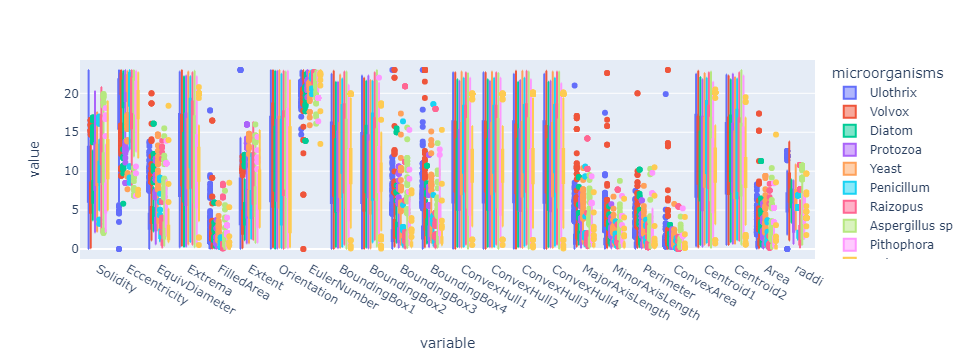

In [64]:
#DATA VISUALIZATION
df2 = df.melt(id_vars=['microorganisms'])
df2.head()
fig = px.box(df2, x="variable", y="value", color="microorganisms").update_yaxes(matches=None)
fig.update_traces(quartilemethod="exclusive") 
fig.show()

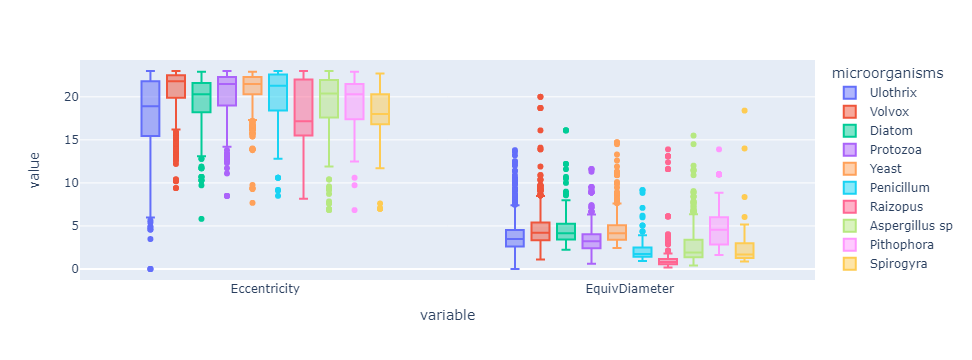

In [65]:
df3 = df2.head(10000)
np.unique(df3['variable'])
df4 = df2.iloc[5000:15000, :]
fig = px.box(df4, x="variable", y="value", color="microorganisms").update_yaxes(matches=None)
fig.update_traces(quartilemethod="exclusive")
fig.show()

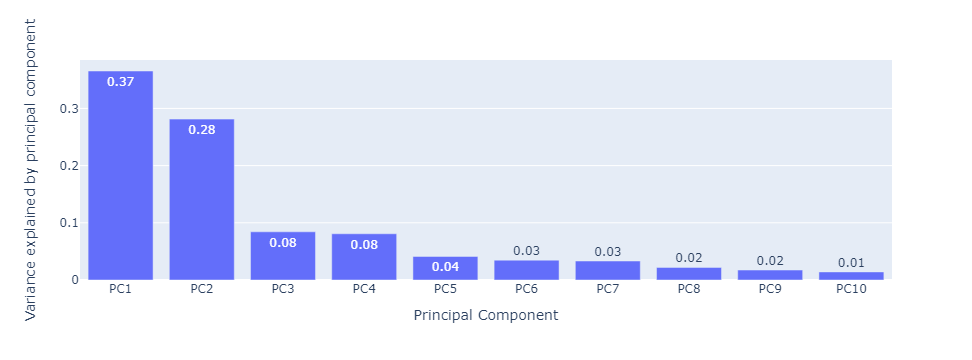

In [66]:
iks1 = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10']
iks = [1,2,3,4,5,6,7,8,9,10]
pca = PCA(n_components = 10)
pca.fit(X_s)
X_pca_scaled = pca.transform(X_s)
fig = px.bar(x = iks1, y= pca.explained_variance_ratio_, text_auto= '.2f' ,
             labels={'x':'Principal Component', 'y':'Variance explained by principal component'})
fig.show()

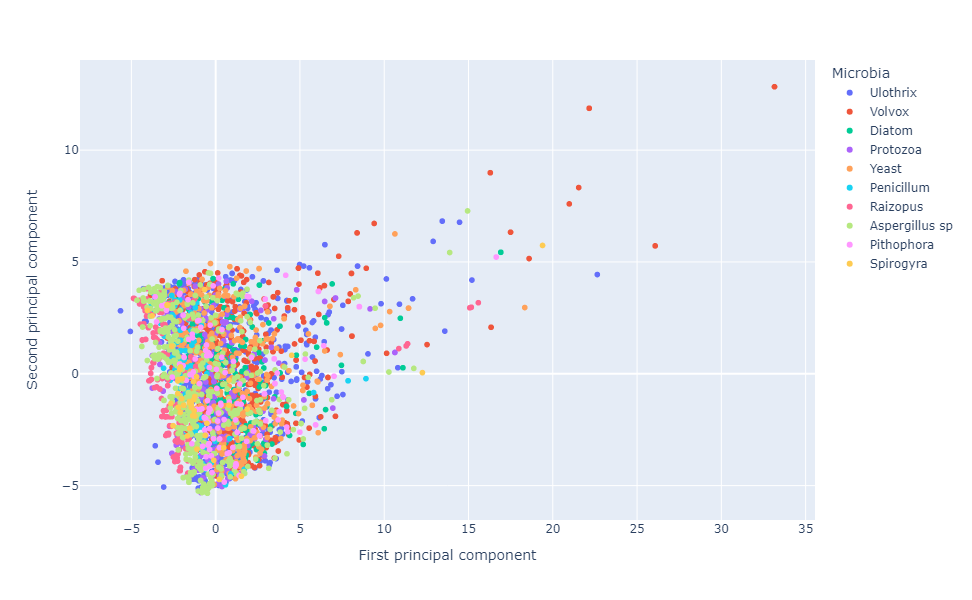

In [67]:
fig = px.scatter(x= X_pca_scaled[:, 0], y= X_pca_scaled[:, 1], color = df.iloc[:,24], width=800, height=600,
                labels={'x':'First principal component', 'y': 'Second principal component', 'color': 'Microbia'})
fig.show()

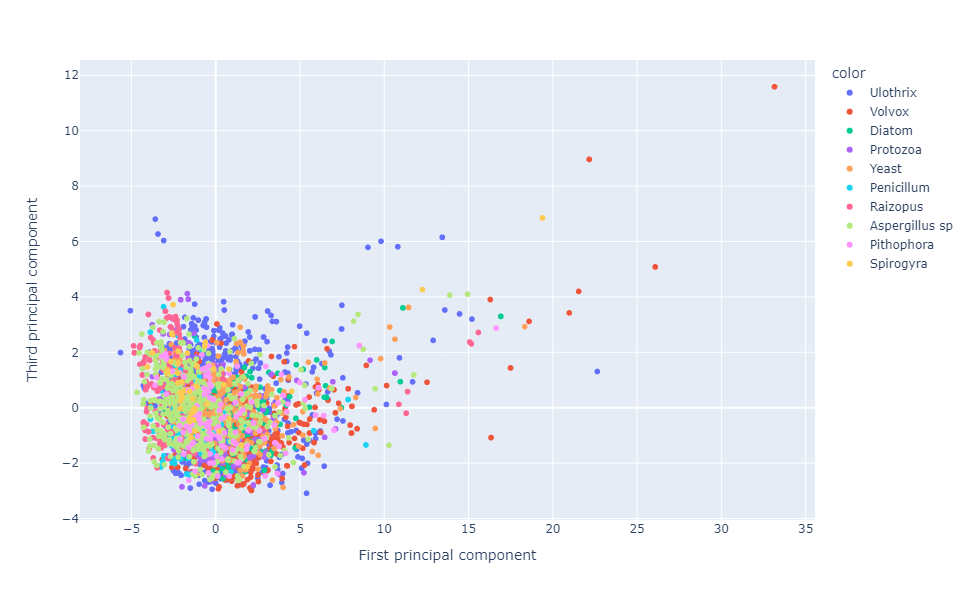

In [68]:
fig = px.scatter(x= X_pca_scaled[:, 0], y= X_pca_scaled[:, 2], color = df.iloc[:,24], width=800, height=600,
                labels={'x':'First principal component', 'y': 'Third principal component'})
fig.show()

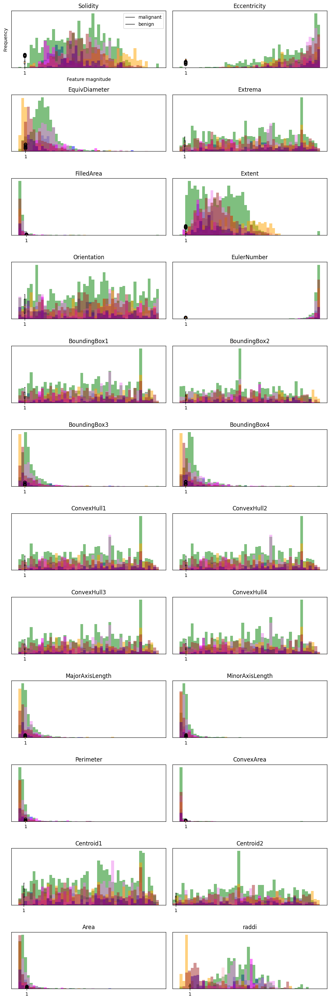

In [69]:

fig, axes = plt.subplots(12, 2, figsize=(10, 30))
feature_names = df.columns.to_numpy()[0:]

malignant = X[y == 'Volvox']
benign = X[y == 'Diatom']
three = X[y == 'Ulothrix']
four = X[y == 'Protoza']
five = X[y == 'Yeast']
six = X[y == 'Raizopus']
sev = X[y == 'Spirogyra']
eight = X[y == 'Pithophora']
nine = X[y == 'Aspergillus sp']
ten = X[y == 'Penicillum']


ax = axes.ravel()
for i in range(24):
    _, bins = np.histogram(X[:, i], bins=50)
    ax[i].boxplot(malignant[:, i])
    ax[i].hist(benign[:, i], bins=bins, color="blue", alpha=.5)
    ax[i].hist(three[:, i], bins=bins, color="green", alpha=.5)
    ax[i].hist(four[:, i], bins=bins, color="yellow", alpha=.5)
    ax[i].hist(five[:, i], bins=bins, color="violet", alpha=.5)
    ax[i].hist(six[:, i], bins=bins, color="orange", alpha=.5)
    ax[i].hist(sev[:, i], bins=bins, color="pink", alpha=.5)
    ax[i].hist(eight[:, i], bins=bins, color="magenta", alpha=.5)
    ax[i].hist(nine[:, i], bins=bins, color="brown", alpha=.5)
    ax[i].hist(ten[:, i], bins=bins, color="indigo", alpha=.5)
    ax[i].set_title(feature_names[i])
    ax[i].set_yticks(())
ax[0].set_xlabel("Feature magnitude")
ax[0].set_ylabel("Frequency")
ax[0].legend(["malignant", "benign"], loc="best")
fig.tight_layout()

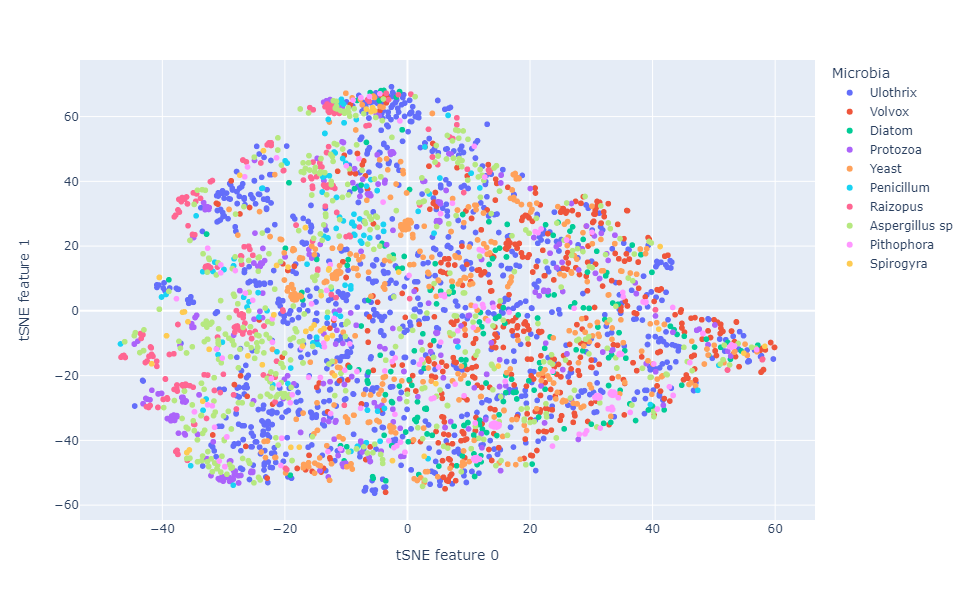

In [70]:
tsne = TSNE(random_state=42,perplexity=100 )
rna_tsne = tsne.fit_transform(X_pca_scaled)

fig = px.scatter(x= rna_tsne[:, 0], y= rna_tsne[:, 1], width=800, height=600,
                labels={'x':'tSNE feature 0', 'y': 'tSNE feature 1', 'color': 'Microbia'}, color = df.iloc[:,24])
fig.show()

In [ ]:
#CLASSIFIER 1 - SVM

param_grid = [{'svm__kernel': ['rbf'],
               'svm__C': [10, 100, 1000, 5000, 10000],
               'svm__gamma': [0.01, 0.1, 1, 10, 100]},
              {'svm__kernel': ['linear'],
               'svm__C': [10, 100, 1000, 5000, 10000]}]
scaler = RobustScaler()
svm = SVC(probability = True, random_state = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state=0)

pipe = Pipeline(steps=[("scaler", scaler),("svm", svm)])

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, scoring = 'f1_macro')
search.fit(X_train, y_train)
print("Best parameter (CV score={:.2f}:".format(search.best_score_))
print(search.best_params_)


In [71]:

param_grid = {'svm__C': [10, 100, 1000, 10000, 100000],
               'svm__gamma': [0.01, 0.1, 1, 10, 100]}
scaler = RobustScaler()
svm = SVC(probability = True, random_state = 1, kernel = 'rbf' )
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state=0)

pipe = Pipeline(steps=[("scaler", scaler),("svm", svm)])

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, scoring = 'f1_macro')
search.fit(X_train, y_train)
print("Best parameter (CV score={:.2f}:".format(search.best_score_))
print(search.best_params_)



Best parameter (CV score=0.76:
{'svm__C': 1000, 'svm__gamma': 1}


In [72]:
print("Accuracy on training set: {:.3f}".format(search.score(X_train, y_train)))

Accuracy on training set: 1.000


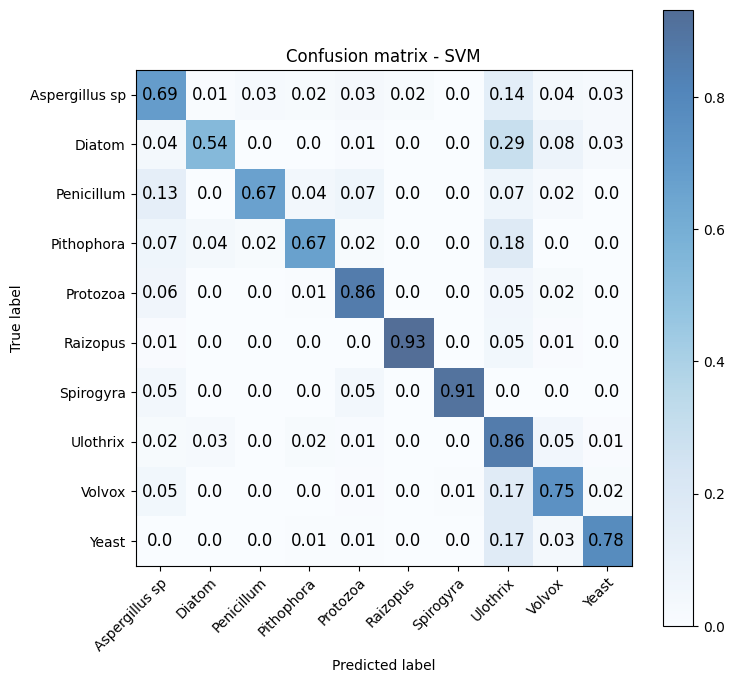

In [73]:
conf_matrix = confusion_matrix(y_test, search.predict(X_test))
cm_svm = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
confusion_mat(cm_svm, 'Confusion matrix - SVM')

In [74]:
print(classification_report(y_test, search.predict(X_test)))

                precision    recall  f1-score   support

Aspergillus sp       0.74      0.69      0.71       159
        Diatom       0.78      0.54      0.64        72
    Penicillum       0.86      0.67      0.75        45
    Pithophora       0.74      0.67      0.70        55
      Protozoa       0.88      0.86      0.87       152
      Raizopus       0.97      0.93      0.95       103
     Spirogyra       0.91      0.91      0.91        22
      Ulothrix       0.68      0.86      0.76       310
        Volvox       0.79      0.75      0.77       185
         Yeast       0.91      0.78      0.84       147

      accuracy                           0.79      1250
     macro avg       0.82      0.77      0.79      1250
  weighted avg       0.80      0.79      0.79      1250



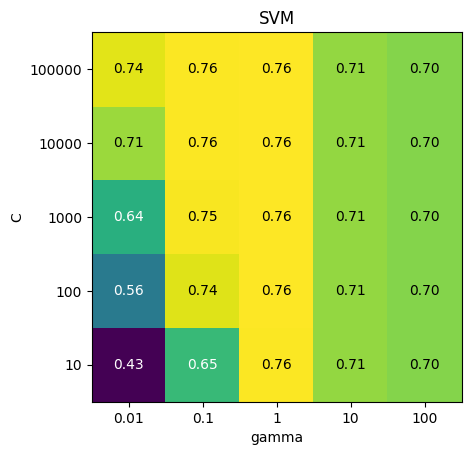

In [75]:
results = pd.DataFrame(search.cv_results_)
#print(param_grid)
scores = np.array(results.mean_test_score).reshape(5, 5)

heatmap(scores, title = 'SVM', xlabel='gamma', xticklabels=param_grid['svm__gamma'], ylabel='C', yticklabels=param_grid['svm__C'], cmap="viridis");

In [16]:
X_train_r, X_test_r, y_train, y_test = train_test_split(X_r, y, stratify = y, random_state=0)

final_svc =  SVC(kernel='rbf', C=1000, gamma = 1,probability = True, random_state = 1)
final_svc.fit(X_train_r, y_train)

perm_importance = permutation_importance(final_svc, X_test_r, y_test)

features = np.array(var_names)

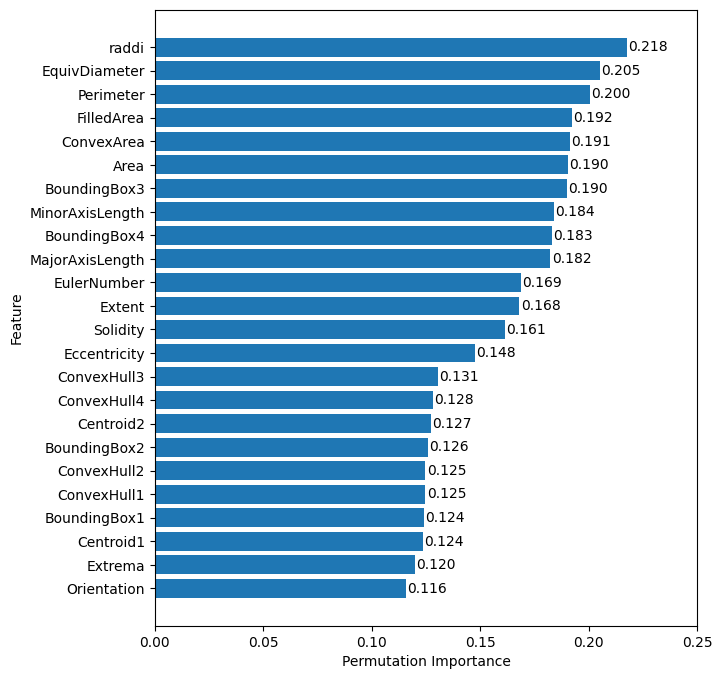

In [17]:
#Code adapted from https://stackoverflow.com/a/67910281/19375985
fig, ax = plt.subplots(1, 1, figsize=(7, 8))
sorted_idx = perm_importance.importances_mean.argsort()
bars = plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")
ax.bar_label(bars, fmt='%.3f', padding = 1)
plt.xticks(np.arange(0,0.3,0.05))
plt.ylabel("Feature")
plt.show(bars)

In [18]:
# GRID SEARCH - RANDOM FOREST
param_grid = { 'forest__max_features': [5,10, 12, 14],
             'forest__max_depth': [10, 20, 30]}
#scaler = StandardScaler()
forest = RandomForestClassifier(random_state=0, n_estimators = 1000, min_samples_split = 2, min_samples_leaf = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state=0)

pipe = Pipeline(steps=[("forest", forest)])

search2 = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, scoring = 'f1_macro')
search2.fit(X_train, y_train)
print("Best parameter (CV score={:.2f}:".format(search2.best_score_))
print(search2.best_params_)

Best parameter (CV score=0.81:
{'forest__max_depth': 20, 'forest__max_features': 12}


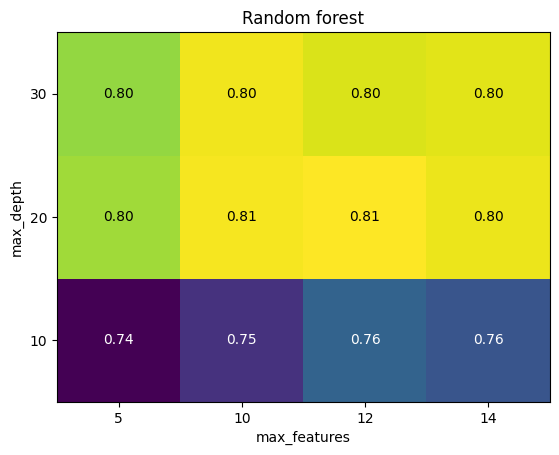

In [21]:
results2 = pd.DataFrame(search2.cv_results_)
scores2 = np.array(results2.mean_test_score).reshape(3, 4)
heatmap(scores2, title = 'Random forest', xlabel='max_features', xticklabels=param_grid['forest__max_features'], ylabel='max_depth', yticklabels=param_grid['forest__max_depth'], cmap="viridis");

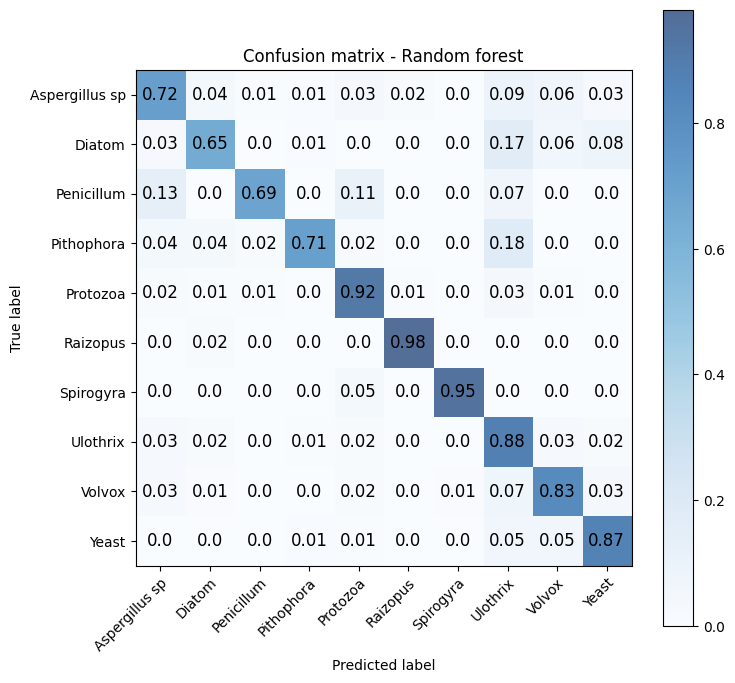

In [22]:
conf_matrix2 = confusion_matrix(y_test, search2.predict(X_test))
cm2 = conf_matrix2.astype('float') / conf_matrix2.sum(axis=1)[:, np.newaxis]
confusion_mat(cm2, 'Confusion matrix - Random forest')

In [23]:
print("Accuracy on training set: {:.2f}".format(search2.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(search2.score(X_test, y_test)))

Accuracy on training set: 1.00
Accuracy on test set: 0.83


In [24]:

print(classification_report(y_test, search2.predict(X_test)))

                precision    recall  f1-score   support

Aspergillus sp       0.81      0.72      0.76       159
        Diatom       0.71      0.65      0.68        72
    Penicillum       0.89      0.69      0.78        45
    Pithophora       0.85      0.71      0.77        55
      Protozoa       0.86      0.92      0.89       152
      Raizopus       0.95      0.98      0.97       103
     Spirogyra       0.91      0.95      0.93        22
      Ulothrix       0.81      0.88      0.84       310
        Volvox       0.83      0.83      0.83       185
         Yeast       0.86      0.87      0.86       147

      accuracy                           0.84      1250
     macro avg       0.85      0.82      0.83      1250
  weighted avg       0.84      0.84      0.83      1250



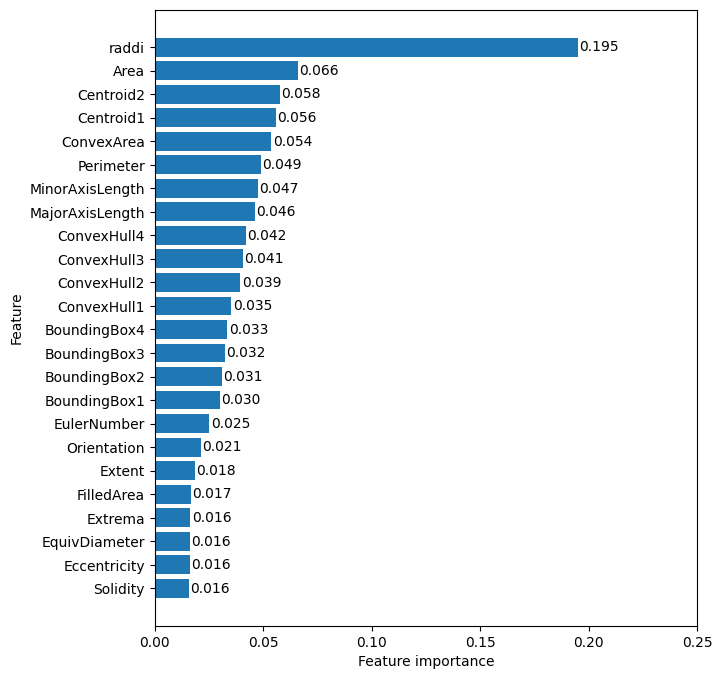

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(7, 8))

# Code copied from the class notes and slightly modified
def plot_feature_importances(model): 
    n_features = X.shape[1]
    bars = ax.barh(range(n_features), sorted(model.feature_importances_), align='center')
    ax.bar_label(bars, fmt='%.3f', padding = 1)
    plt.yticks(np.arange(n_features), var_names)
    plt.xticks(np.arange(0,0.3, 0.05))
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.show(bars)
    
forest_final = RandomForestClassifier(max_features = 12, max_depth = 20,
    random_state=0, n_estimators = 1000, min_samples_split = 2, min_samples_leaf = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state=0)
forest_final.fit(X_train, y_train)
plot_feature_importances(forest_final)

In [76]:
#Classifier 3 - LOGISTIC REGRESSION


logistic = LogisticRegression(max_iter=10000, l1_ratio = 0.5)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state = 50)

scaler = StandardScaler()
pipe = Pipeline(steps=[("scaler", scaler), ("logistic", logistic)])

param_grid = [{'logistic__penalty': ['l2'],
               'logistic__C': [0.1, 1, 10, 100, 1000],
               'logistic__solver': ['newton-cg', 'lbfgs', 'liblinear']},
              {'logistic__penalty': ['l1'],
               'logistic__C': [0.1, 1, 10, 100, 1000],
               'logistic__solver': ['liblinear']},
              {'logistic__penalty': ['elasticnet'],
               'logistic__C': [0.1, 1, 10, 100, 1000],
               'logistic__solver': ['saga']}]

search_log = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, scoring = 'f1_macro')
search_log.fit(X_train, y_train)
print("Best parameter (CV score={:.2f}:".format(search_log.best_score_))
print(search_log.best_params_)

Best parameter (CV score=0.41:
{'logistic__C': 1000, 'logistic__penalty': 'elasticnet', 'logistic__solver': 'saga'}


In [54]:
print("Accuracy on training set: {:.3f}".format(search_log.score(X_train, y_train)))

Accuracy on training set: 0.439


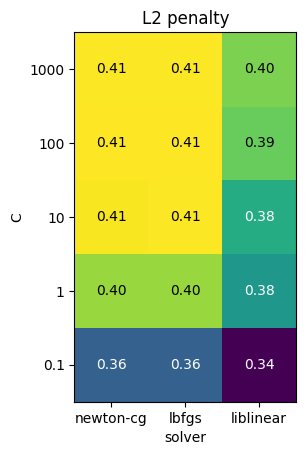

In [26]:
logistic1 = LogisticRegression(max_iter=10000)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state = 50)

scaler = StandardScaler()
pipe1 = Pipeline(steps=[("scaler", scaler), ("logistic", logistic1)])

param_grid1 = {'logistic__penalty': ['l2'],
               'logistic__C': [0.1, 1, 10, 100, 1000],
               'logistic__solver': ['newton-cg', 'lbfgs', 'liblinear']}
             
search_log1 = GridSearchCV(pipe1, param_grid1, n_jobs=-1, cv=5, scoring = 'f1_macro')
search_log1.fit(X_train, y_train)
results1 = pd.DataFrame(search_log1.cv_results_)
scores_1 = np.array(results1.mean_test_score).reshape(5, 3)
heatmap(scores_1, title = 'L2 penalty', xlabel='solver', 
        xticklabels= param_grid1['logistic__solver'], ylabel='C', yticklabels= param_grid1['logistic__C'], cmap="viridis")

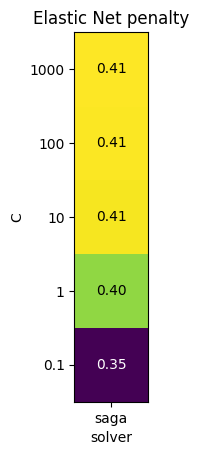

In [27]:
logistic3 = LogisticRegression(max_iter=10000, l1_ratio = 0.5 )
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state = 50)

scaler3 = StandardScaler()
pipe3 = Pipeline(steps=[("scaler", scaler), ("logistic", logistic3)])

param_grid3 = {'logistic__penalty': ['elasticnet'],
               'logistic__C': [0.1, 1, 10, 100, 1000],
               'logistic__solver': ['saga']}

search_log3 = GridSearchCV(pipe3, param_grid3, n_jobs=-1, cv=5, scoring = 'f1_macro')
search_log3.fit(X_train, y_train)
results3 = pd.DataFrame(search_log3.cv_results_)
scores_3 = np.array(results3.mean_test_score).reshape(5, 1)
h3 = heatmap(scores_3, title = 'Elastic Net penalty', xlabel='solver', xticklabels= param_grid3['logistic__solver'], ylabel='C', yticklabels= param_grid3['logistic__C'], cmap="viridis")


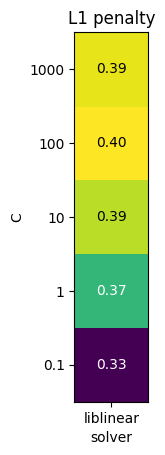

In [28]:
logistic2 = LogisticRegression(max_iter=10000)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state = 50)

scaler = StandardScaler()
pipe2 = Pipeline(steps=[("scaler", scaler), ("logistic", logistic2)])

param_grid2  = {'logistic__penalty': ['l1'],
               'logistic__C': [0.1, 1, 10, 100, 1000],
               'logistic__solver': ['liblinear']}

search_log2 = GridSearchCV(pipe2, param_grid2, n_jobs=-1, cv=5, scoring = 'f1_macro')
search_log2.fit(X_train, y_train)
results2 = pd.DataFrame(search_log2.cv_results_)
scores_2 = np.array(results2.mean_test_score).reshape(5, 1)
heatmap(scores_2, title = 'L1 penalty',  xlabel='solver', 
        xticklabels= param_grid2['logistic__solver'], ylabel='C', yticklabels= param_grid2['logistic__C'], cmap="viridis");

In [77]:
print(classification_report(y_test, search_log.predict(X_test)))


                precision    recall  f1-score   support

Aspergillus sp       0.39      0.38      0.38       159
        Diatom       0.52      0.33      0.41        72
    Penicillum       0.33      0.09      0.14        45
    Pithophora       0.54      0.47      0.50        55
      Protozoa       0.57      0.48      0.52       152
      Raizopus       0.62      0.83      0.71       103
     Spirogyra       0.00      0.00      0.00        22
      Ulothrix       0.47      0.64      0.54       310
        Volvox       0.55      0.51      0.53       185
         Yeast       0.62      0.53      0.57       147

      accuracy                           0.52      1250
     macro avg       0.46      0.43      0.43      1250
  weighted avg       0.51      0.52      0.50      1250



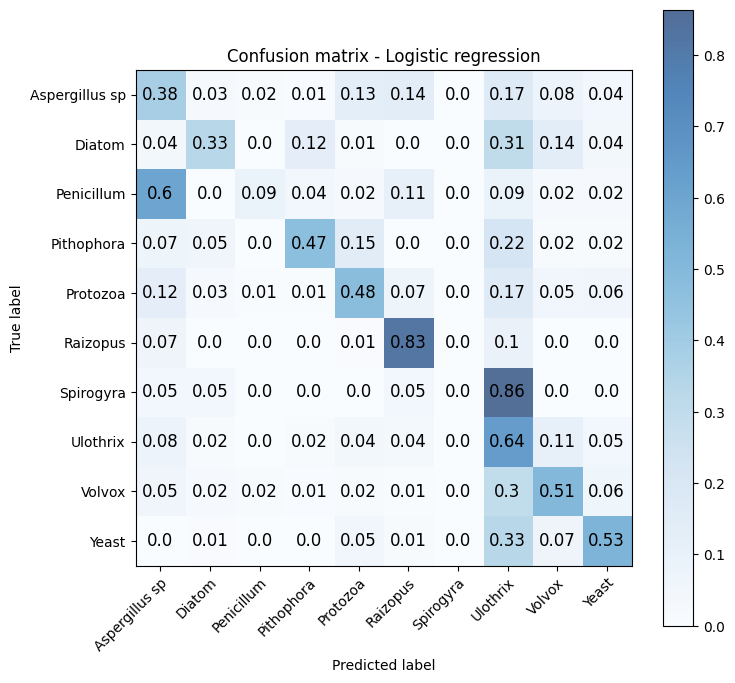

In [78]:
conf= confusion_matrix(y_test, search_log.predict(X_test))
cm1 = conf.astype('float') / conf.sum(axis=1)[:, np.newaxis]
confusion_mat(cm1, 'Confusion matrix - Logistic regression')

In [31]:
final_logistic = LogisticRegression(max_iter=10000, l1_ratio = 0.5, penalty = 'elasticnet', C = 1000, solver = 'saga' )
X_train_s, X_test_s, y_train, y_test = train_test_split(X_s, y, stratify = y, random_state = 50)

final_logistic.fit(X_train_s, y_train)

importance = final_logistic.coef_[0]
d = {'names': var_names, 'importance': importance }
data = pd.DataFrame(d)
data = data.sort_values(by=['importance'])


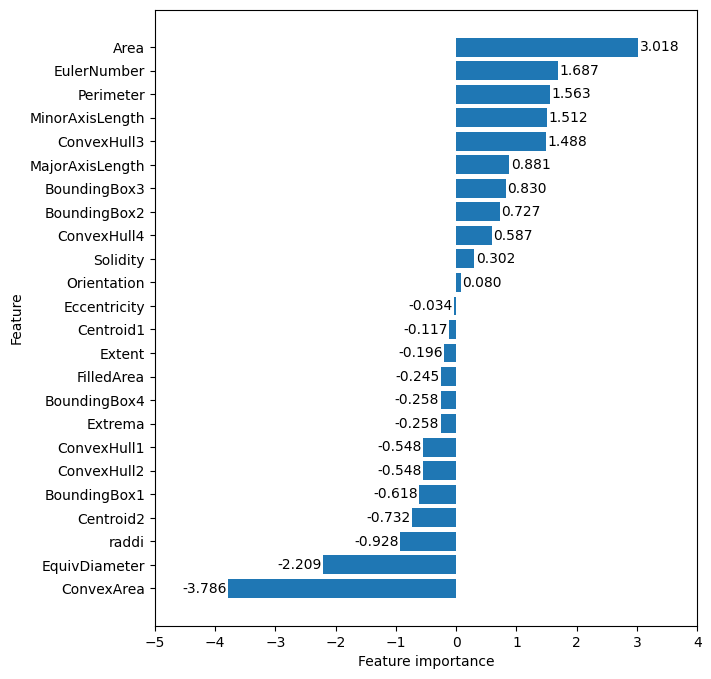

In [32]:
# plot feature importance - code adapted from https://machinelearningmastery.com/calculate-feature-importance-with-python/
fig, ax = plt.subplots(1, 1, figsize=(7, 8))
bars = plt.barh(data['names'], (data['importance']))
ax.bar_label(bars, fmt='%.3f', padding = 1)
plt.yticks(data['names'])
plt.xticks(np.arange(-5,5))
plt.xlabel("Feature importance")
plt.ylabel("Feature")
plt.show(bars)

    

In [79]:
#Classifier 4 - MULTILAYER PERCEPTRON


param_grid= {
    'mlp__hidden_layer_sizes': [(100,100,100),(1000,100)],
    'mlp__activation': ['tanh', 'relu'],
    'mlp__solver': ['adam', 'lbfgs'],
    'mlp__alpha': [0.001, 0.05],
}

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

mlp = MLPClassifier(max_iter=500, random_state=0)
scaler = StandardScaler()

pipe_mlp = Pipeline(steps=[("scaler", scaler), ("mlp", mlp)])

# In order to refer to the parameters in each of the steps in the pipeline we just specify the name of the step followed by "__"

search_mlp = GridSearchCV(pipe_mlp, param_grid, n_jobs=-1, cv=5, scoring = 'f1_macro' )
search_mlp.fit(X_train, y_train)
print("Best parameter (CV score={:.2f}:".format(search_mlp.best_score_))
print(search_mlp.best_params_)

print("Accuracy on training set: {:.2f}".format(search_mlp.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(search_mlp.score(X_test, y_test)))


Best parameter (CV score=0.75:
{'mlp__activation': 'tanh', 'mlp__alpha': 0.05, 'mlp__hidden_layer_sizes': (100, 100, 100), 'mlp__solver': 'lbfgs'}
Accuracy on training set: 1.00
Accuracy on test set: 0.78


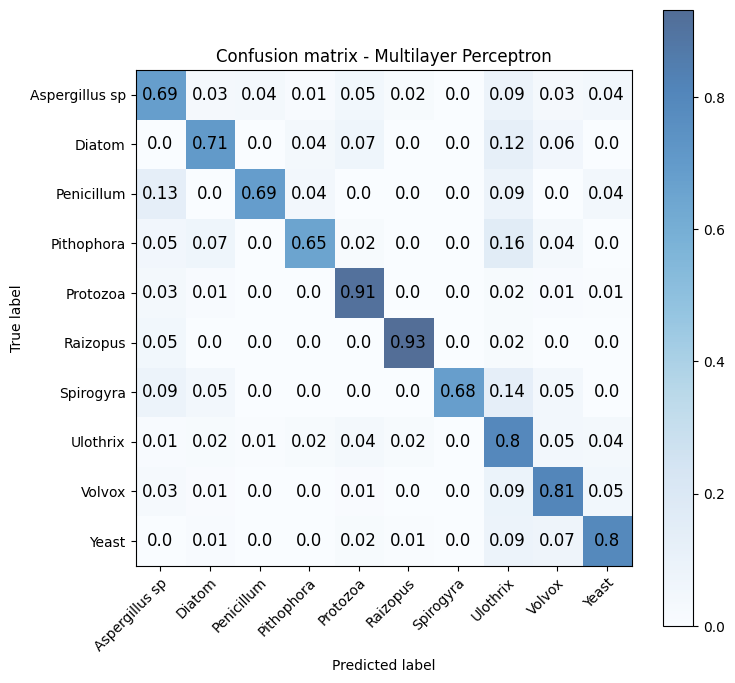

In [80]:
conf= confusion_matrix(y_test, search_mlp.predict(X_test))
cm4 = conf.astype('float') / conf.sum(axis=1)[:, np.newaxis]
confusion_mat(cm4, 'Confusion matrix - Multilayer Perceptron')

In [81]:
print(classification_report(y_test, search_mlp.predict(X_test)))


                precision    recall  f1-score   support

Aspergillus sp       0.78      0.69      0.73       159
        Diatom       0.70      0.71      0.70        72
    Penicillum       0.79      0.69      0.74        45
    Pithophora       0.75      0.65      0.70        55
      Protozoa       0.82      0.91      0.87       152
      Raizopus       0.91      0.93      0.92       103
     Spirogyra       0.94      0.68      0.79        22
      Ulothrix       0.77      0.80      0.78       310
        Volvox       0.79      0.81      0.80       185
         Yeast       0.79      0.80      0.79       147

      accuracy                           0.79      1250
     macro avg       0.80      0.77      0.78      1250
  weighted avg       0.79      0.79      0.79      1250



In [ ]:
X_train_s, X_test_s, y_train, y_test = train_test_split(X_s, y, stratify=y, random_state=42)

final_mlp = MLPClassifier(max_iter=500, random_state=0,
                    activation = 'tanh', alpha =  0.05,
                    hidden_layer_sizes =  (100, 100, 100), 
                    solver = 'lbfgs')
final_mlp.fit(X_train_s, y_train)
coefs = final_mlp.coefs_


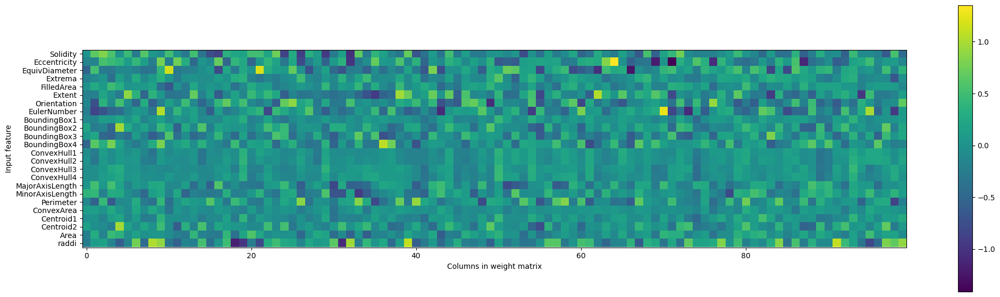

In [41]:
#Code adapted from the class notebooks
var_names = df.columns.to_numpy()[0:24:]
var_names
coefs= np.array(coefs)
plt.figure(figsize=(25, 7))
plt.imshow((coefs[0]), interpolation='none', cmap='viridis')
plt.yticks(range(24), var_names)
plt.xlabel("Columns in weight matrix")
plt.ylabel("Input feature")
plt.colorbar();

In [54]:
#uncertainty of the predictions

def correct_predictions(classifier, x_test, y_test):
    pred_classifier = classifier.predict(x_test)
    correct_pred = []
    for i in range(len(pred_classifier)):
        if pred_classifier[i] == y_test[i]:
            correct_pred.append(i)
    probs1 = classifier.predict_proba(x_test)
    probs1 = probs1[correct_pred]
    return probs1

def incorrect_predictions(classifier, x_test, y_test):
    pred_classifier = classifier.predict(x_test)
    correct_pred = []
    for i in range(len(pred_classifier)):
        if pred_classifier[i] != y_test[i]:
            correct_pred.append(i)
    probs1 = classifier.predict_proba(x_test)
    probs1 = probs1[correct_pred]
    return probs1

def uncertainty(probs, clasifier):
    top_probability = []
    class_index = []
    for i in range(len(probs)):
        pro = list(probs[i])
        top = max(pro)
        index = pro.index(top)
        top_probability.append(top)
        class_index.append(index)
    d = {clasifier :top_probability,'Class Index':class_index}
    dat = pd.DataFrame(d)
    dat = dat.groupby('Class Index').mean()
    return dat

probs_logistic =  correct_predictions(final_logistic, X_test_s, y_test)
probs_svm = correct_predictions(final_svc, X_test_r, y_test)
probs_forest =  correct_predictions(forest_final, X_test, y_test)
probs_mlp =  correct_predictions(final_mlp, X_test_s, y_test)

a = uncertainty(probs_logistic, 'Logistic Regression')
b = uncertainty(probs_svm , 'SVM')
c = uncertainty(probs_forest, 'Random Forest')
d = uncertainty(probs_mlp, 'MLP')

average_prob = pd.concat([a,b,c,d], axis = 1).fillna(0)
average_prob = average_prob.sort_values(by=['Class Index'])
average_prob.insert(1, "Classes", ['Aspergillus sp', 'Diatom', 'Penicillum', 'Pithophora','Protozoa', 'Raizopus','Spirogyra','Ulothrix','Volvox','Yeast'])
average_prob1 = average_prob.loc[0:4, :]
average_prob2 =  average_prob.loc[5:9,:]



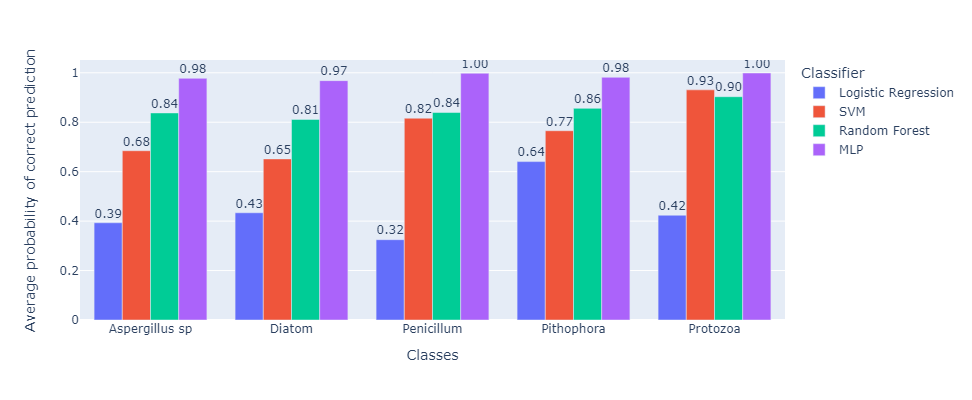

In [55]:
fig = px.bar(average_prob1, x = 'Classes', y= ["Logistic Regression",
                                               'SVM', 'Random Forest',
                                                'MLP'], barmode='group',height=400, width = 1200,
            text_auto='.2f', labels={'value': 'Average probability of correct prediction', 'variable': 'Classifier'})
fig.update_traces(textposition='outside')
fig.show()

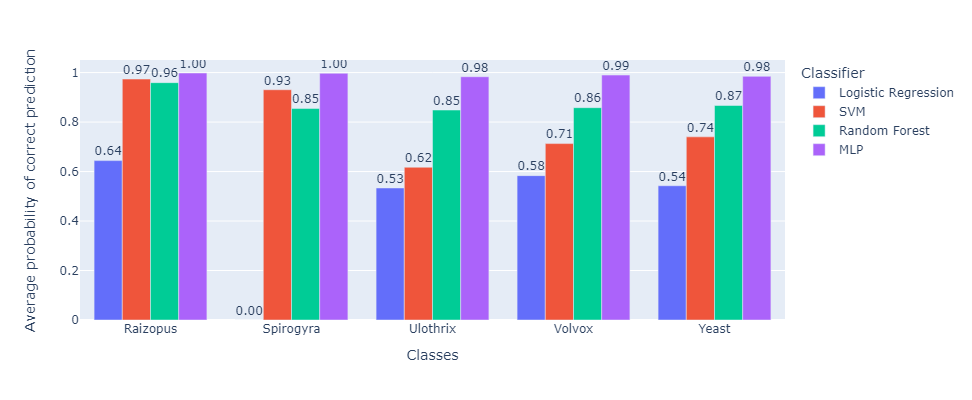

In [56]:
fig = px.bar(average_prob2, x = 'Classes', y= ["Logistic Regression",
                                               'SVM', 'Random Forest',
                                                'MLP'], barmode='group',height=400, width = 1200,
            text_auto='.2f', labels={'value': 'Average probability of correct prediction', 'variable': 'Classifier'})
fig.update_traces(textposition='outside')
fig.show()

In [47]:
#RESULTS ON THE UNLABELLED DATASET
df1 = pd.read_csv('data-microbes-unlabelled.csv')
df1.head()

X1  = df1.iloc[:,0:24].to_numpy()
#print(X1.shape)
a = list(forest_final.predict(X1))
p = forest_final.predict_proba(X1)
top_sample_probability = []
for i in range(len(p)):
    pro = list(p[i])
    top = max(pro)
    top_sample_probability.append(top)
  
sample = []
for i in range(1,21):
    sample.append('Sample '+ str(i))

r= {'Sample' : sample,'Predicted Class': a, 'Certainty of the prediction' : top_sample_probability}
results = pd.DataFrame(r)    
results.head()
#results.to_csv(r'C:\Users\anial\File_name.csv', index=False)

,Sample,Predicted Class,Certainty of the prediction
0,Sample 1,Diatom,0.674618
1,Sample 2,Yeast,0.812464
2,Sample 3,Ulothrix,0.308663
3,Sample 4,Ulothrix,0.994000
4,Sample 5,Diatom,0.682581


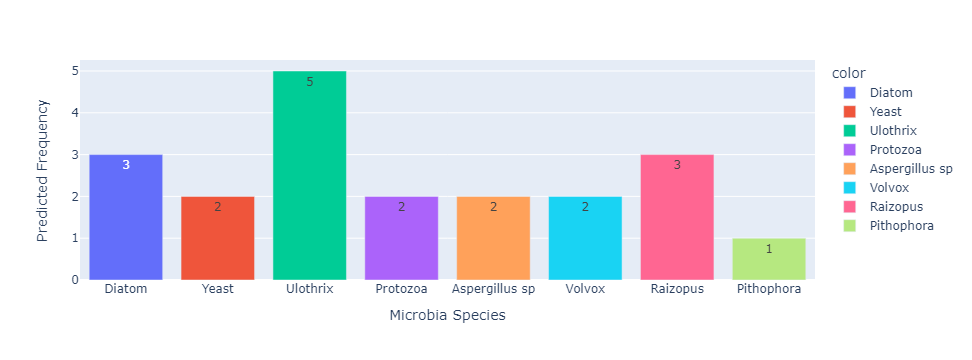

In [46]:
counter = collections.Counter(a)
dic = dict(counter)
dic
fig = px.bar(x = dic.keys(), y= dic.values(), text_auto = True, color = dic.keys(),
             labels={'x':'Microbia Species', 'y': 'Predicted Frequency'})
fig.show()